## Creating dataset and analyzing 3D statistics

In [1]:
#! pip install atomman

In [2]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
from matplotlib.colors import LogNorm
from matplotlib.patches import Patch
import ase                        
import copy
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from scipy.spatial import ConvexHull
import ast

from scipy.spatial import Delaunay
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from collections import defaultdict
import pickle, math, pathlib
import pandas as pd
from collections import Counter
import networkx as nx
import sys
import os
sys.path.append(os.path.abspath('..'))

In [3]:
from functions import finding_defects as df
from functions import layers 
from functions import three_d as dimension

In [4]:
percentages = ["5", "9_1", "12_5"]
loaded_data = {}

for perc in percentages:
    fn = f"../data/stats/{perc}_percent_stats_20250623.pkl"
    with open(fn, "rb") as f:
        loaded_data[perc] = pickle.load(f)     # store *all* keys for that percent

## uncomment to make df for the first time
this assigns all defects to categories and assigns an id to each defect cluster with the size of it

In [ ]:
#all_blocks = dimension.make_df()
#dimension.save_df(all_blocks, "filtered_data")

In [5]:
df_all = dimension.load_df("all_filtered_data")
df_all

,percent,sample_id,group,label,vac_size,category,cluster_uid,x,y,flat_cat
0,5,0,2,atom,NaN,atom,5_0_-1,259.523,6.098,['atom']
1,5,0,3,atom,NaN,atom,5_0_-1,272.182,5.855,['atom']
2,5,0,1,atom,NaN,atom,5_0_-1,284.841,5.612,['atom']
3,5,0,2,atom,NaN,atom,5_0_-1,297.501,5.369,['atom']
4,5,0,3,atom,NaN,atom,5_0_-1,310.160,5.126,['atom']
...,...,...,...,...,...,...,...,...,...,...
155115,12_5,25,2,defect,1.0,isolated vacancy,12_5_25_44,456.465,407.179,['isolated vacancy']
155116,12_5,25,3,defect,2.0,sandwich,12_5_25_45,21.790,417.100,['sandwich']
155117,12_5,25,2,defect,2.0,sandwich,12_5_25_45,9.899,417.650,['sandwich']
155118,12_5,25,2,defect,2.0,complex,12_5_25_38,407.693,480.821,['complex']


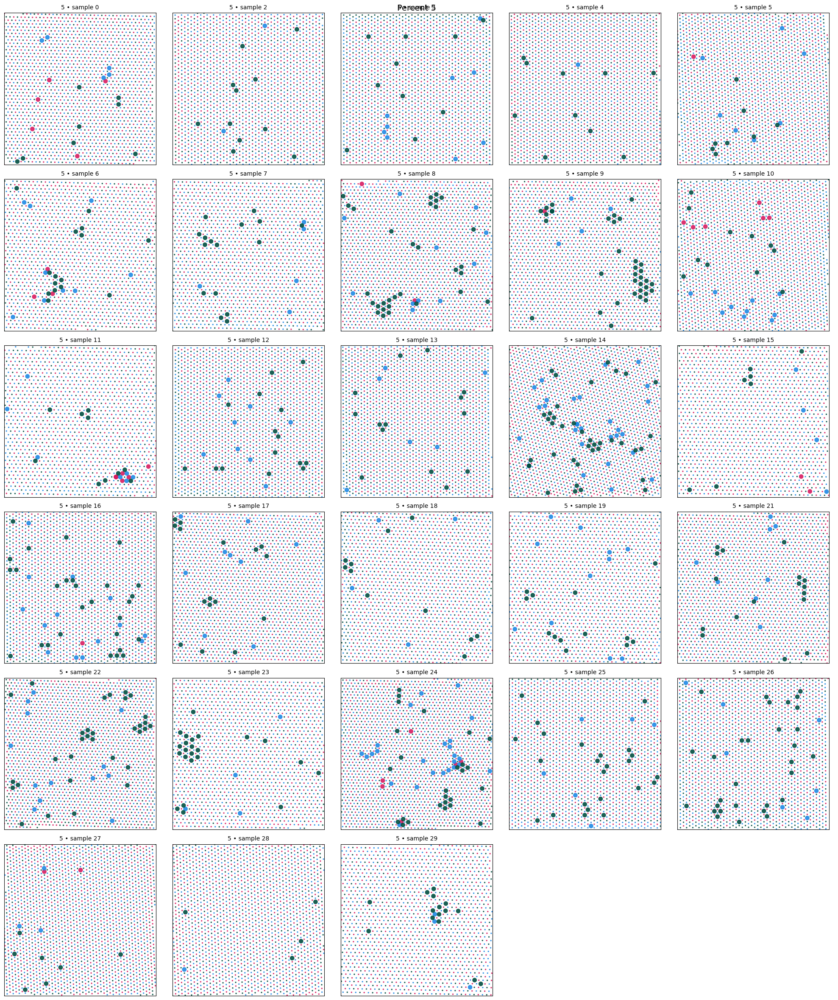

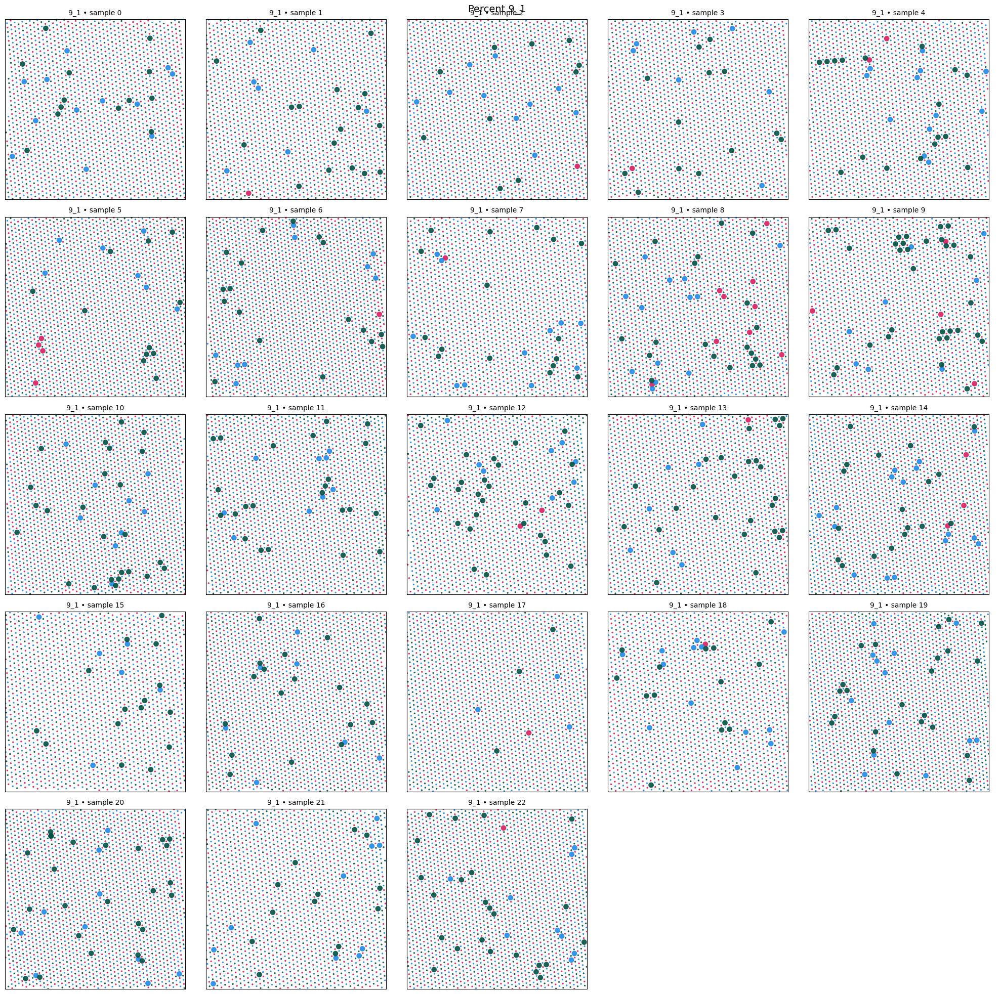

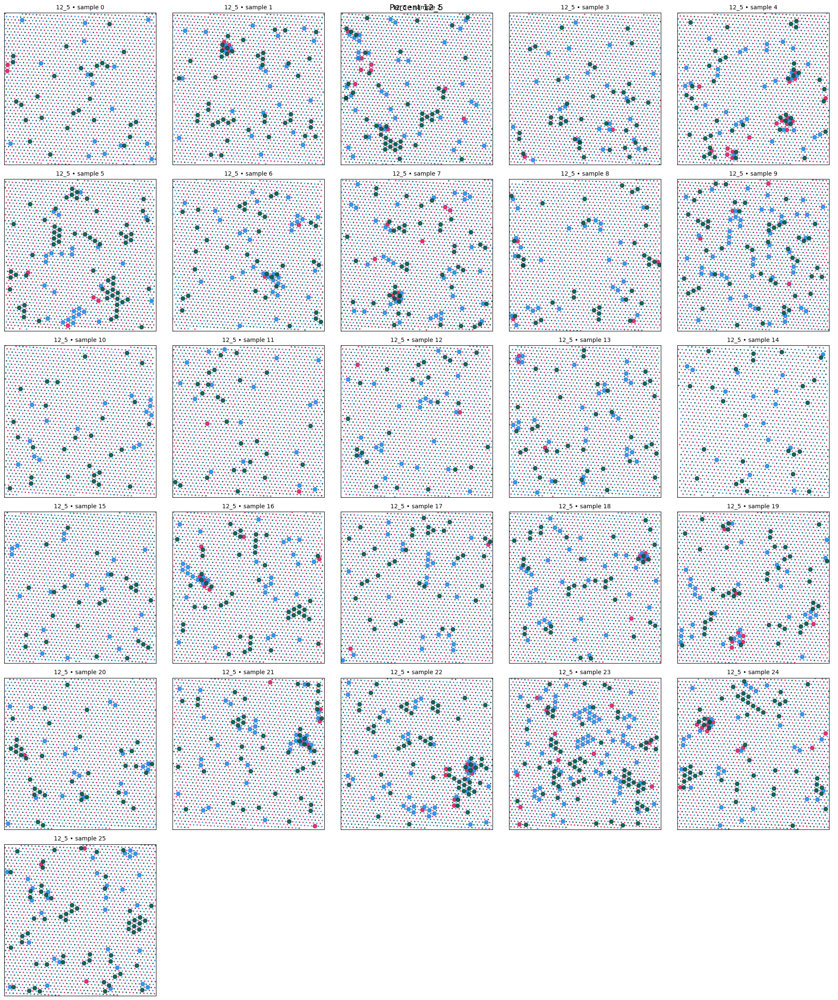

In [6]:
# assumes df_all from before

per_order = [p for p in ['5', '9_1', '12_5'] if p in set(df_all['percent'])]
if len(per_order) != df_all['percent'].nunique():
    per_order = sorted(df_all['percent'].unique(), key=str)

groups = sorted(df_all['group'].dropna().unique())
base_colors = ['#D81B60','#1E88E5','#004D40','#7B1FA2','#F4511E','#3949AB','#43A047','#00838F','#6D4C41']
group_color = {g: base_colors[i % len(base_colors)] for i, g in enumerate(groups)}

size_map   = {'atom': 6, 'defect': 60, 'adatom': 30}
marker_map = {'atom': 'o', 'defect': 'o', 'adatom': 'x'}

for p in per_order:
    sample_ids = sorted(df_all.loc[df_all['percent']==p, 'sample_id'].unique())
    ncols = min(5, len(sample_ids))
    nrows = -(-len(sample_ids) // ncols)  # ceil div

    sub_p = df_all[df_all['percent'] == p]
    xmin, xmax = sub_p['x'].min(), sub_p['x'].max()
    ymin, ymax = sub_p['y'].min(), sub_p['y'].max()

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows), squeeze=False)
    for idx, sid in enumerate(sample_ids):
        r, c = divmod(idx, ncols)
        ax = axes[r, c]
        sub = sub_p[sub_p['sample_id'] == sid]
        for (lbl, grp), chunk in sub.groupby(['label', 'group']):
            ax.scatter(
                chunk['x'], chunk['y'],
                s=size_map.get(lbl, 10),
                marker=marker_map.get(lbl, 'o'),
                c=group_color.get(grp, '#999999'),
                edgecolors='none', alpha=0.9
            )
        ax.set_title(f"{p} • sample {sid}", fontsize=10)
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        ax.set_aspect('equal')
        ax.set_xticks([]); ax.set_yticks([])
    # turn off unused axes
    for idx in range(len(sample_ids), nrows*ncols):
        r, c = divmod(idx, ncols)
        axes[r, c].axis('off')

    fig.suptitle(f"Percent {p}", fontsize=14)
    plt.tight_layout()
    plt.show()


In [ ]:
CLUSTER_COLORS  = ["orange", "#4daf4a", "#f781bf", "#e41a1c"]
GROUP_COLOR     = {1: 'fuchsia', 2: "dodgerblue", 3: "midnightblue"}
SAMPLE_COLOR = { "12_5": "#D81B60","9_1":  "#1E88E5",  "5":    "#67E25C"}

In [8]:
# % of atoms in *each layer* that are defects
perc_order = ['5', '9_1', '12_5']

# helper: map 1→middle, 2&3→outer
layer_map = {1: 'middle', 2: 'outer', 3: 'outer'}

# atoms per layer
atoms_layer = (df_all.query("label == 'atom'")
                      .assign(layer=df_all['group'].map(layer_map))
                      .groupby(['percent', 'layer'])
                      .size()
                      .unstack(fill_value=0)
                      .reindex(index=perc_order))

# defects per layer
defects_layer = (df_all.query("label == 'defect'")
                        .assign(layer=df_all['group'].map(layer_map))
                        .groupby(['percent', 'layer'])
                        .size()
                        .unstack(fill_value=0)
                        .reindex(index=perc_order))

pct_def_layer = (100 * defects_layer / atoms_layer).round(2)   # outer & middle cols
print(pct_def_layer.rename(columns={'outer': 'outer_%', 'middle': 'middle_%'}))



layer    middle_%  outer_%
percent                   
5            0.21     2.05
9_1          0.22     2.16
12_5         0.69     5.15


5% HF → Middle: 0.21 %,  Outer: 2.05 %


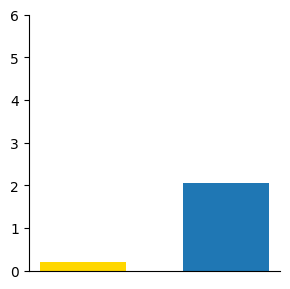

9_1% HF → Middle: 0.22 %,  Outer: 2.16 %


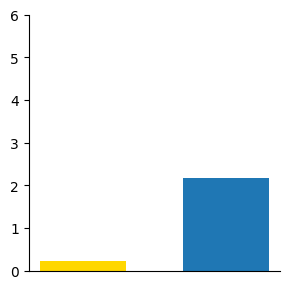

12_5% HF → Middle: 0.69 %,  Outer: 5.15 %


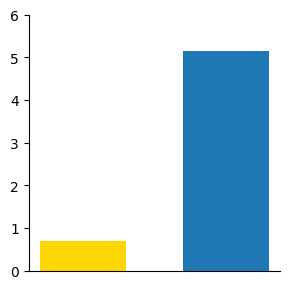

In [9]:
# combine outer-min (2) & outer-max (3) → single “Outer” bar
layer_map = {1: 'middle', 2: 'outer', 3: 'outer'}
x_lbl = [r'$M^{\prime\prime}$', r'$M^{\prime}$']         # Middle, Outer
clr   = {'middle': 'gold', 'outer': 'tab:blue'}

for p in ['5', '9_1', '12_5']:
        sub = df_all[df_all['percent'] == p]

        atoms   = (sub[sub['label'] == 'atom']
                        .assign(layer=sub['group'].map(layer_map))
                        .groupby('layer').size())
        defects = (sub[sub['label'] == 'defect']
                        .assign(layer=sub['group'].map(layer_map))
                        .groupby('layer').size())

        vals = 100 * defects / atoms            # % defects in each layer
        vals = vals.reindex(['middle', 'outer'])  # enforce order
        print(f"{p}% HF → Middle: {vals['middle']:.2f} %,  Outer: {vals['outer']:.2f} %")

        plt.figure(figsize=(3, 3))
        plt.bar(range(2), vals, width=.6,
                color=[clr['middle'], clr['outer']])
        plt.ylim(0, 6)
        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)
        plt.xticks([])  # remove x labels
        plt.tight_layout()
        plt.show()


## view biggest defects

In [10]:
vc = (df_all.query("label=='defect'")
        .groupby(['percent', 'sample_id',      # image identifier
                  'cluster_uid',               # vacancy (cluster) ID
                  'category'])                 # vacancy type
        .size()
        .reset_index(name='count')             # → percent, image id, vacancy id, category, count
        .sort_values('count', ascending=False))

print(vc.head(25))


     percent  sample_id cluster_uid         category  count
1245       5          9       5_9_0  surface_cluster     17
256     12_5          5    12_5_5_5          complex     17
913     12_5         21  12_5_21_30         nanopore     16
993     12_5         23  12_5_23_21          complex     16
959     12_5         22   12_5_22_3          complex     16
1507       5         23      5_23_3  surface_cluster     14
976     12_5         22   12_5_22_7         nanopore     14
47      12_5          1   12_5_1_18         nanopore     12
1078    12_5         24  12_5_24_40         nanopore     12
991     12_5         23   12_5_23_2          complex     11
305     12_5          7    12_5_7_1         nanopore     11
1235       5          8       5_8_2  surface_cluster     11
1055    12_5         24   12_5_24_2          complex     11
1288       5         11      5_11_3         nanopore     11
783     12_5         18  12_5_18_22         nanopore     10
194     12_5          4   12_5_4_24     

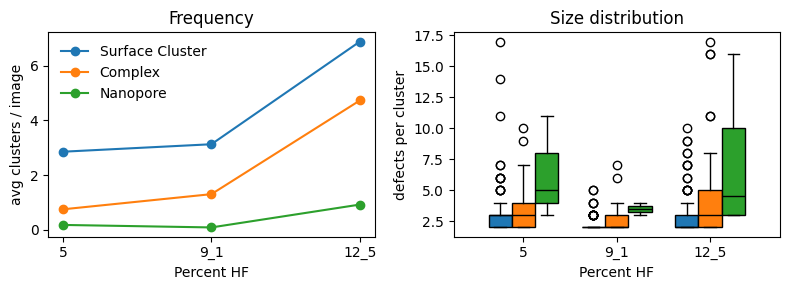

In [11]:
# ── same cluster table as before ──────────────────────────────────────────
cats = ['surface_cluster', 'complex', 'nanopore']
df_tmp = df_all.copy()
df_tmp.loc[df_tmp['category'].isin(['pit', 'sandwich']), 'category'] = 'complex'

clusters = (df_tmp.query("label=='defect'")
              .groupby(['percent', 'sample_id', 'cluster_uid', 'category'])
              .size()
              .reset_index(name='cluster_size'))

# ── avg clusters / image ────────────────────────────────────────────────
cnt = (clusters.groupby(['percent', 'sample_id', 'category'])['cluster_uid']
                 .nunique()
                 .reset_index(name='n_clusters'))

base = (df_tmp[['percent', 'sample_id']]
          .drop_duplicates()
          .assign(key=1)
          .merge(pd.DataFrame({'category': cats, 'key': 1}), on='key')
          .drop('key', axis=1))

cnt = (base.merge(cnt, on=['percent', 'sample_id', 'category'], how='left')
           .fillna({'n_clusters': 0}))

cnt_avg = (cnt.groupby(['percent', 'category'])['n_clusters']
                 .mean()
                 .unstack()
                 .reindex(["5", "9_1", "12_5"]))

# ── plot ────────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt

perc_order = ["5", "9_1", "12_5"]
colors = {'surface_cluster': 'tab:blue',
          'complex':         'tab:orange',
          'nanopore':        'tab:green'}
width  = .25
pos0   = np.arange(len(perc_order))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 3), sharex=False, tight_layout=True)

# left: frequency (same as before)
for cat in cats:
    ax1.plot(cnt_avg.index.astype(str), cnt_avg[cat], '-o', color=colors[cat],
             label=cat.replace('_', ' ').title())
ax1.set_xlabel('Percent HF')
ax1.set_ylabel('avg clusters / image')
ax1.set_title('Frequency')
ax1.legend(frameon=False)

# right: distribution (box-and-whisker) of cluster sizes
for i, cat in enumerate(cats):
    data = [clusters.query("percent==@p and category==@cat")['cluster_size'].values
            for p in perc_order]
    pos = pos0 + (i - 1)*width       # center groups
    bp = ax2.boxplot(data, positions=pos, widths=width, patch_artist=True)
    for box in bp['boxes']:
        box.set_facecolor(colors[cat])
    for med in bp['medians']:
        med.set_color('black')

ax2.set_xticks(pos0)
ax2.set_xticklabels(perc_order)
ax2.set_xlabel('Percent HF')
ax2.set_ylabel('defects per cluster')
ax2.set_title('Size distribution')
plt.show()



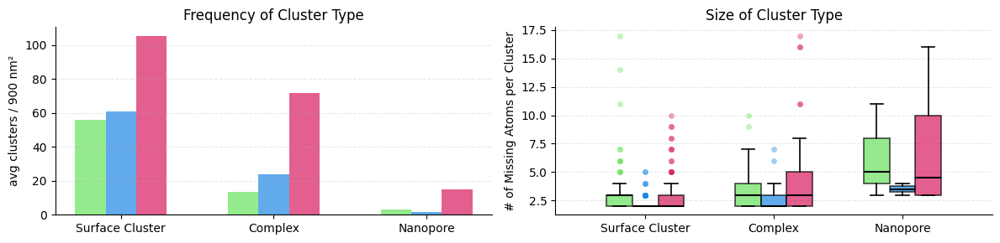

In [12]:
cats       = ['surface_cluster', 'complex', 'nanopore']
perc_order = ["5", "9_1", "12_5"]
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3), tight_layout=True)

n = len(perc_order)
w = 0.2
pos0 = np.arange(len(cats))

# ── frequency (mean clusters / 30×30 nm²) ──────────────────────────────
for i, p in enumerate(perc_order):
    sids_all = pd.Series(df_all.query("percent==@p")["sample_id"]).dropna().astype(int).unique()
    sids_all.sort()
    area_nm2 = {sid: (512.0 * float(loaded_data[p]['img_stats'][sid]['pixel_size_nm']))**2 for sid in sids_all}

    vals = []
    for c in cats:
        sub = clusters.query("category==@c and percent==@p")
        counts_by_sid = sub['sample_id'].astype(int).value_counts().to_dict()
        freqs = []
        for sid in sids_all:
            n_clust = counts_by_sid.get(int(sid), 0)
            dens_per_nm2 = n_clust / area_nm2[sid] if area_nm2[sid] > 0 else 0.0
            freqs.append(dens_per_nm2 * 900)
        vals.append(float(np.mean(freqs)) if freqs else 0.0)

    shift = (i - (n - 1) / 2) * w
    ax1.bar(pos0 + shift, vals, width=w,
            color=SAMPLE_COLOR[p], label=f'{p}%', alpha=.7)

ax1.set(xticks=pos0,
        xticklabels=[c.replace('_', ' ').title() for c in cats],
        ylabel='avg clusters / 900 nm²', 
        title='Frequency of Cluster Type')
ax1.grid(axis='y', ls='--', alpha=.3)
ax1.spines[['top', 'right']].set_visible(False)
ax1.set_xlabel(None)
#ax1.legend(frameon=False)

# ── size distribution (box-and-whisker) ─────────────────────────────────
style = dict(linewidth=1.2)
for i, p in enumerate(perc_order):
    data = [clusters.query("category==@c and percent==@p")['cluster_size'].values for c in cats]
    shift = (i - (n - 1) / 2) * w
    flier_style = dict(marker='o', markersize=5,
                       markerfacecolor=SAMPLE_COLOR[p], alpha=.4,
                       markeredgewidth=0)
    ax2.boxplot(data,
                positions=pos0 + shift, widths=w,
                patch_artist=True, showfliers=True,
                boxprops     = dict(**style, facecolor=SAMPLE_COLOR[p], alpha=.7),
                whiskerprops = style,
                capprops     = style,
                medianprops  = dict(color='black', linewidth=1.5),
                flierprops   = flier_style)

ax2.set(xticks=pos0,
        xticklabels=[c.replace('_', ' ').title() for c in cats],
        ylabel='# of Missing Atoms per Cluster',
        title='Size of Cluster Type')
ax2.grid(axis='y', ls='--', alpha=.3)
ax2.spines[['top', 'right']].set_visible(False)
ax2.set_xlabel(None)

plt.show()



In [13]:
# Build frequency table
freq_table = []
for p in perc_order:
    sids_all = pd.Series(df_all.query("percent==@p")["sample_id"]).dropna().astype(int).unique()
    sids_all.sort()
    area_nm2 = {sid: (512.0 * float(loaded_data[p]['img_stats'][sid]['pixel_size_nm']))**2 for sid in sids_all}

    row = {'percent': p}
    for c in cats:
        sub = clusters.query("category==@c and percent==@p")
        counts_by_sid = sub['sample_id'].astype(int).value_counts().to_dict()
        freqs = []
        for sid in sids_all:
            n_clust = counts_by_sid.get(int(sid), 0)
            dens_per_nm2 = n_clust / area_nm2[sid] if area_nm2[sid] > 0 else 0.0
            freqs.append(dens_per_nm2 * 900)
        row[c] = float(np.mean(freqs)) if freqs else 0.0
    freq_table.append(row)

df_freq = pd.DataFrame(freq_table)
df_freq[cats] = df_freq[cats].round(1)
print(df_freq.to_string(index=False))


percent  surface_cluster  complex  nanopore
      5             55.9     13.3       3.1
    9_1             60.9     23.7       1.4
   12_5            105.4     71.6      15.0


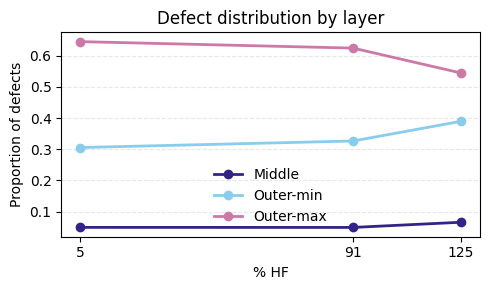

In [14]:
# proportion of defects by layer, bars colored by %HF

grp_order  = [1, 2, 3]
grp_lbl    = ['Middle', 'Outer-min', 'Outer-max']
perc_order = ["5", "9_1", "12_5"]

counts = (df_all.query("label=='defect'")
            .groupby(['percent', 'group'])
            .size()
            .unstack(fill_value=0)
            .reindex(columns=grp_order)
            .reindex(index=perc_order))

prop = counts.div(counts.sum(axis=1), axis=0).T   # rows = group, cols = percent

perc_vals = prop.columns.astype(float)
col_map   = {1: "#332288", 2: "#88CCEE", 3: "#CC79A7"}  # CVD-safe colors

fig, ax = plt.subplots(figsize=(5, 3))
for g in grp_order:
    ax.plot(perc_vals, prop.loc[g], "-o", lw=2,
            color=col_map[g], label=grp_lbl[g-1])

ax.set_xlabel('% HF')
ax.set_ylabel('Proportion of defects')
ax.set_title('Defect distribution by layer')
ax.set_xticks(perc_vals)
ax.grid(axis='y', ls='--', alpha=.3)
ax.legend(frameon=False)
plt.tight_layout()
plt.show()



